<a href="https://colab.research.google.com/github/vinupillai/data-science-notebooks/blob/master/Plant_seedling_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
#import IPython.display as display
#from PIL import Image
from datetime import datetime
import matplotlib.image as mpimg
import numpy as np
import pandas as pd
import random
import math
import cv2
import os
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import img_to_array
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.callbacks import TensorBoard
import warnings
warnings.filterwarnings("ignore")
%load_ext tensorboard
import pathlib
tf.__version__

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


'2.2.0'

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!unzip -q '/content/drive/My Drive/Learning/ML/CNN/plant-seedlings-classification'

In [4]:
!ls

drive  sample_data  sample_submission.csv  test  train


In [0]:
train_data_path = './train'
test_data_path = './test'
image_size = (196, 196)
batch_size = 32

In [0]:
train_ds = tf.data.Dataset.list_files(train_data_path + '/*/*.png')
test_ds = tf.data.Dataset.list_files(test_data_path + '/*.png')

## Checking a sample image from train set

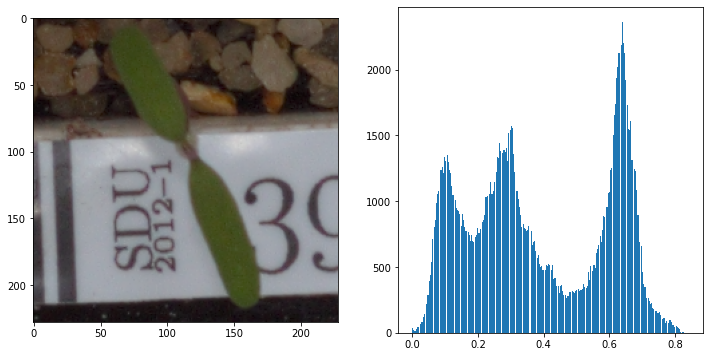

Sample image shape is (228, 228, 3)


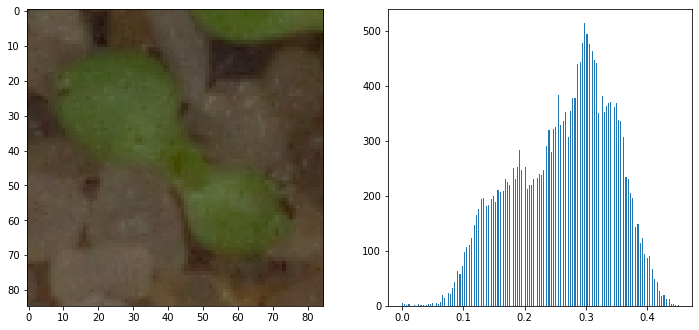

Sample image shape is (85, 85, 3)


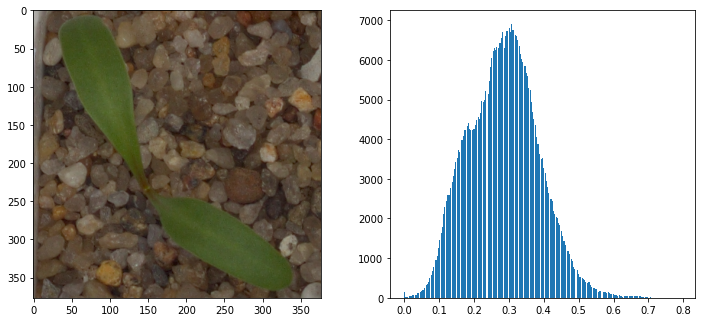

Sample image shape is (377, 377, 3)


In [9]:
train_sample_size = 3
n_rows = train_sample_size
n_cols = 2
for row, file_tensor in zip(range(n_rows), train_ds.take(train_sample_size)):
  sample_image = mpimg.imread(tf.compat.as_str_any(file_tensor.numpy()))
  plt.figure(figsize=(12, 6 * (row + 1)))
  ax = plt.subplot(100*(row + 1) + 21)
  plt.imshow(sample_image)
  ax = plt.subplot(100*(row + 1) + 22)
  plt.hist(img_to_array(sample_image).ravel(), bins=255)
  plt.show()
  print('Sample image shape is', sample_image.shape)

# Preparing Test Data

Total images in Test set is 794
Viewing a few sample images below


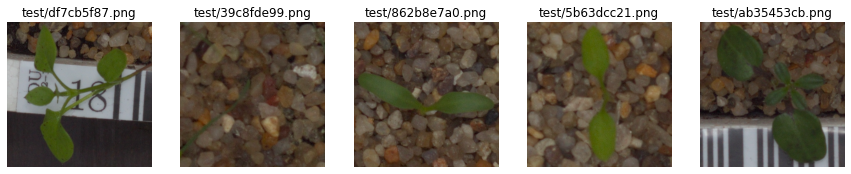

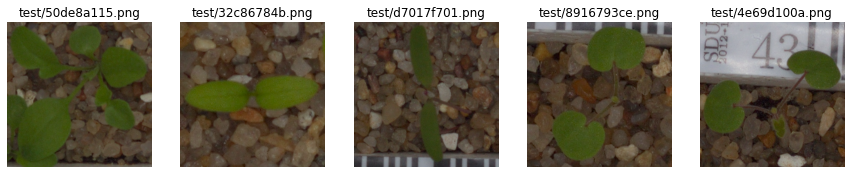

In [10]:
test_data_dir = pathlib.Path(test_data_path)
test_image_count = len(list(test_data_dir.glob('*.png')))
test_seedlings = list(test_data_dir.glob('*.png'))
print('Total images in Test set is', test_image_count)
print('Viewing a few sample images below')
test_sample_size = 10
n_rows = 2
n_cols = math.ceil(test_sample_size/n_rows)
test_samples = test_seedlings[:test_sample_size]
for row in range(n_rows):
  test_sub_samples = test_samples[(row * n_cols) : (row * n_cols) + n_cols]
  plt.figure(figsize=(15, 6 * (row + 1)))
  for i, image_path in zip(range(n_cols), test_sub_samples):
    ax = plt.subplot(100*(row + 1) + 10*n_cols + (i+1))
    plt.imshow(mpimg.imread(str(image_path)))
    plt.title(str(image_path))
    plt.axis("off")
  plt.show()

In [0]:
def get_name(file_path):
  parts = tf.strings.split(file_path, os.path.sep)
  return parts[-1]

In [0]:
X_test, submissions = [], []
for image_path in test_seedlings:
  submissions.append(tf.compat.as_str_any(get_name(os.fspath(image_path)).numpy()))
  test_image = mpimg.imread(os.fspath(image_path))
  test_arr = img_to_array(tf.image.resize(test_image, [image_size[0], image_size[1]]))
  X_test.append(test_arr)
X_test = np.asarray(X_test)

In [13]:
train_datagen = ImageDataGenerator(rescale = 1./255, shear_range = 0.2, validation_split=0.2, 
                                   zoom_range = 0.2, horizontal_flip = True)
test_datagen = ImageDataGenerator(rescale = 1./255)
train_set = train_datagen.flow_from_directory('./train', target_size=image_size, subset='training',
                                                 batch_size = batch_size, class_mode = 'categorical')
eval_set = train_datagen.flow_from_directory('./train', target_size=image_size, subset='validation',
                                                 batch_size = batch_size, class_mode = 'categorical')

Found 3803 images belonging to 12 classes.
Found 947 images belonging to 12 classes.


In [0]:
filepaths = train_set.filepaths
labels = train_set.labels
classes_dict = train_set.class_indices
key_list = list(classes_dict.keys()) 
val_list = list(classes_dict.values())

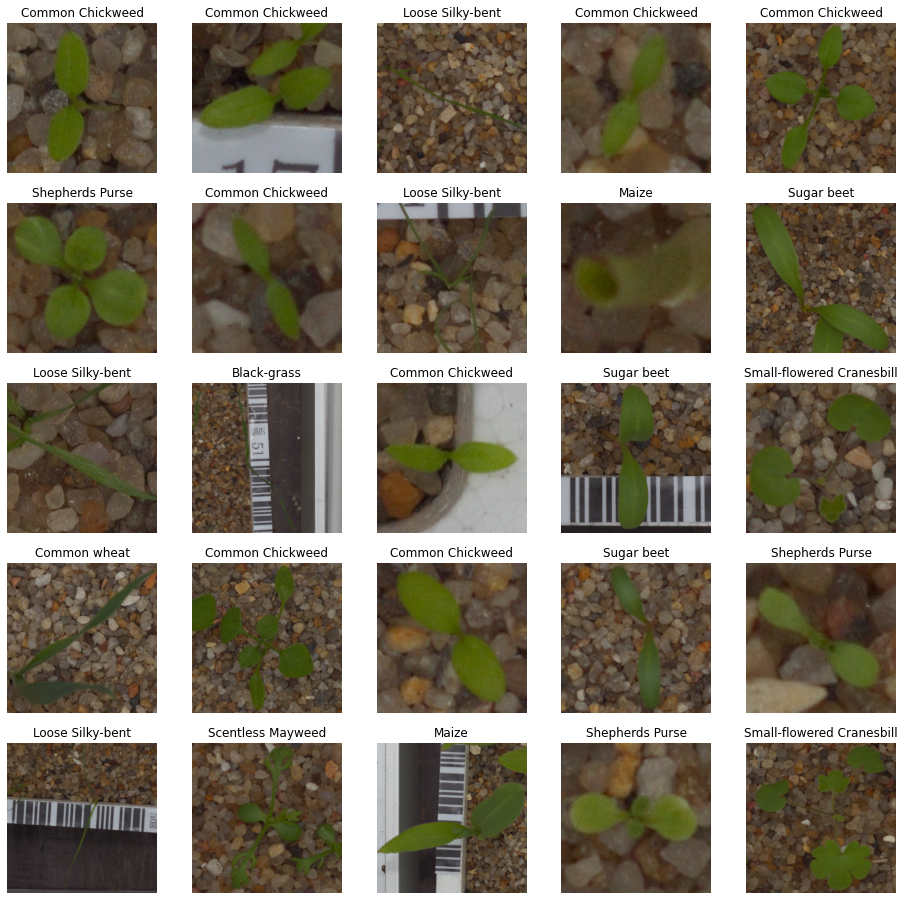

In [15]:
plt.figure(figsize=(16, 16))
for i, val in zip(range(25), random.sample(range(0, train_set.n), 25)):
  ax = plt.subplot(5, 5, i + 1)
  plt.imshow(mpimg.imread(filepaths[val]))
  plt.title(key_list[val_list.index(labels[val])])
  plt.axis("off")
plt.show()

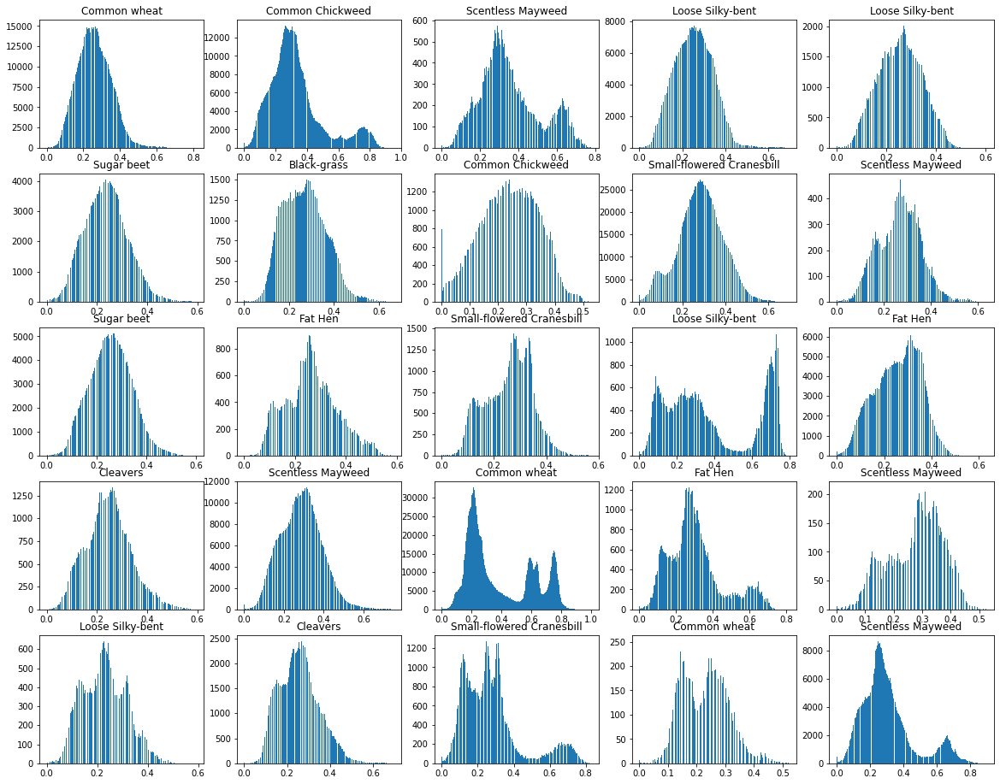

In [16]:
plt.figure(figsize=(20, 16))
for i, val in zip(range(25), random.sample(range(0, train_set.n), 25)):
  ax = plt.subplot(5, 5, i + 1)
  sample_image = mpimg.imread(filepaths[val])
  plt.hist(img_to_array(sample_image).reshape(sample_image.size), bins=255)
  plt.title(key_list[val_list.index(labels[val])])
plt.show()

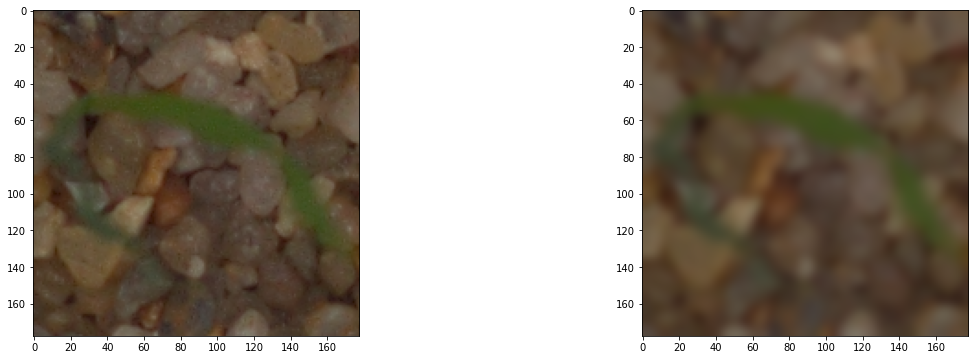

In [17]:
plt.figure(figsize=(20, 6))
ax = plt.subplot(121)
plt.imshow(mpimg.imread(filepaths[10]))
ax = plt.subplot(122)
plt.imshow(cv2.GaussianBlur(mpimg.imread(filepaths[10]), (15, 15), 0))
plt.show()

(178, 178, 3)


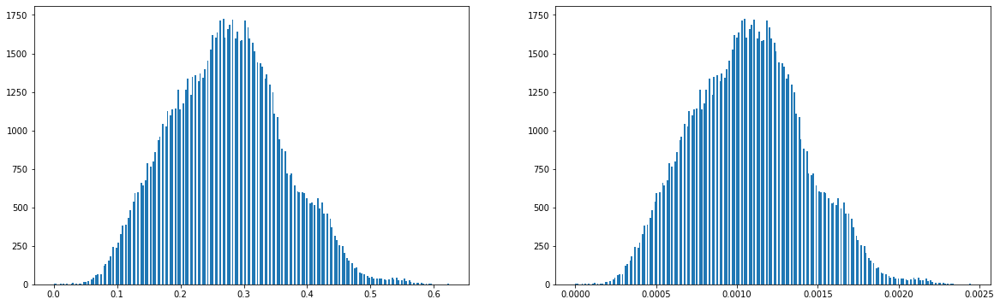

In [18]:
test_image = mpimg.imread(filepaths[10])
print(test_image.shape)
plt.figure(figsize=(20, 6))
ax = plt.subplot(121)
plt.hist(img_to_array(test_image).reshape(test_image.size), bins=255)
test_image = test_image * 1.0/255.0
ax = plt.subplot(122)
plt.hist(img_to_array(test_image).reshape(test_image.size), bins=255)
plt.show()

In [0]:
X_train, X_eval = [], []
y_train, y_eval = [], []
for i in range(round(len(train_set.filenames)/batch_size)):
  X_train_batch, y_train_batch = train_set.next()
  X_train.append(X_train_batch)
  y_train.append(y_train_batch)
X_train = np.concatenate(X_train)
y_train = np.concatenate(y_train)
for i in range(round(len(eval_set.filenames)/batch_size)):
  X_eval_batch, y_eval_batch = eval_set.next()
  X_eval.append(X_eval_batch)
  y_eval.append(y_eval_batch)
X_eval = np.concatenate(X_eval)
y_eval = np.concatenate(y_eval)

In [20]:
print("X_train shape:", X_train.shape)
print("Images in X_train:", X_train.shape[0])
print("Max value in X_train:", X_train.max())
print("Min value in X_train:", X_train.min())
print("y_train shape:", y_train.shape)
print("X_eval shape:", X_eval.shape)
print("Images in X_eval:", X_eval.shape[0])
print("Max value in X_eval:", X_eval.max())
print("Min value in X_eval:", X_eval.min())
print("y_eval shape:", y_eval.shape)
print("X_test shape:", X_test.shape)
print("Images in X_test:", X_test.shape[0])
print("Max value in X_test:", X_test.max())
print("Min value in X_test:", X_test.min())

X_train shape: (3803, 196, 196, 3)
Images in X_train: 3803
Max value in X_train: 1.0
Min value in X_train: 0.0
y_train shape: (3803, 12)
X_eval shape: (947, 196, 196, 3)
Images in X_eval: 947
Max value in X_eval: 1.0
Min value in X_eval: 0.0
y_eval shape: (947, 12)
X_test shape: (794, 196, 196, 3)
Images in X_test: 794
Max value in X_test: 1.0
Min value in X_test: 0.0


In [0]:
#y_train = to_categorical(y_train, num_classes=12)
#y_eval = to_categorical(y_eval, num_classes=12)

In [0]:
# Initialising the CNN classifier
classifier = Sequential()
# Add a Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), input_shape = (image_size[0], image_size[1], 3), activation = 'relu', padding = 'same'))
# Add a Max Pooling layer of size 2X2
classifier.add(MaxPooling2D(pool_size = (2, 2)))
# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))
# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'valid'))
# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))
# Flattening the layer before fully connected layers
classifier.add(Flatten())
# Adding a fully connected layer with 512 neurons
classifier.add(Dense(units = 512, activation = 'relu'))
# Adding dropout with probability 0.5
classifier.add(Dropout(0.5))
# Adding a fully connected layer with 128 neurons
classifier.add(Dense(units = 128, activation = 'relu'))
# The final output layer to predict the categorical classification
classifier.add(Dense(units = len(key_list), activation = 'softmax'))

In [0]:
classifier.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [0]:
logdir = "logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)

In [24]:
%tensorboard --logdir logs/scalars

<IPython.core.display.Javascript object>

In [25]:
training_history = classifier.fit_generator(train_set, steps_per_epoch = int(train_set.n/32), epochs = 35, 
                         validation_data = eval_set, validation_steps = int(eval_set.n/32), callbacks=[tensorboard_callback])
print("Average loss: ", np.average(training_history.history['loss']))
print("Average Accuracy: ", np.average(training_history.history['accuracy']))
print("Average validation loss: ", np.average(training_history.history['val_loss']))
print("Average validation accuracy: ", np.average(training_history.history['val_accuracy']))

Epoch 1/35
118/118 [==============================] - 263s 2s/step - loss: 2.0993 - accuracy: 0.2710 - val_loss: 2.1003 - val_accuracy: 0.3631
Epoch 2/35
118/118 [==============================] - 260s 2s/step - loss: 1.6139 - accuracy: 0.4269 - val_loss: 1.5943 - val_accuracy: 0.5115
Epoch 3/35
118/118 [==============================] - 256s 2s/step - loss: 1.2812 - accuracy: 0.5452 - val_loss: 1.2218 - val_accuracy: 0.6383
Epoch 4/35
118/118 [==============================] - 255s 2s/step - loss: 1.0905 - accuracy: 0.6160 - val_loss: 0.7730 - val_accuracy: 0.7071
Epoch 5/35
118/118 [==============================] - 258s 2s/step - loss: 0.9904 - accuracy: 0.6606 - val_loss: 0.7790 - val_accuracy: 0.6951
Epoch 6/35
118/118 [==============================] - 258s 2s/step - loss: 0.8806 - accuracy: 0.6964 - val_loss: 0.3640 - val_accuracy: 0.7421
Epoch 7/35
118/118 [==============================] - 257s 2s/step - loss: 0.8113 - accuracy: 0.7104 - val_loss: 0.5969 - val_accuracy: 0.7803

In [26]:
classifier.evaluate(X_eval, y_eval)

947/947 [==============================] - 13s 14ms/step


[0.48599757859925913, 0.8722280859947205]

In [0]:
y_pred = classifier.predict(X_test)

# Find out the predictions classes with maximum probability
y_pred_labels = np.argmax(y_pred, axis=1)

In [0]:
species_submissions = pd.DataFrame({'file':submissions, 'species': y_pred_labels})

In [33]:
species_submissions['species'] = species_submissions['species'].apply(lambda pred : key_list[val_list.index(pred)])
species_submissions.to_csv('sample_submission.csv', index=False)
species_submissions.shape

(794, 2)

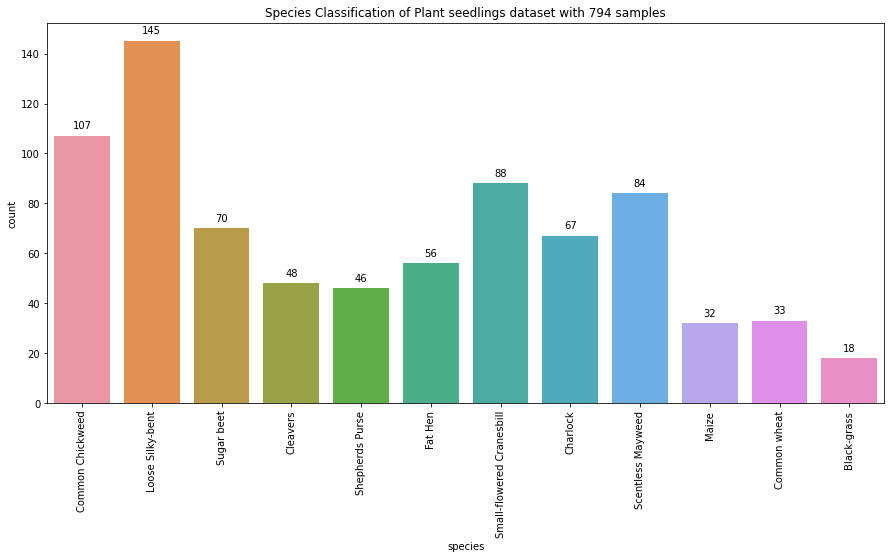

In [34]:
plt.figure(figsize=(15,7))
plt.title('Species Classification of Plant seedlings dataset with %s samples' % (test_image_count))
ax = sns.countplot(x="species", data=species_submissions)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

# Visualizing predictions of samples

In [0]:
sample_labels = [2, 3, 33, 36, 59]

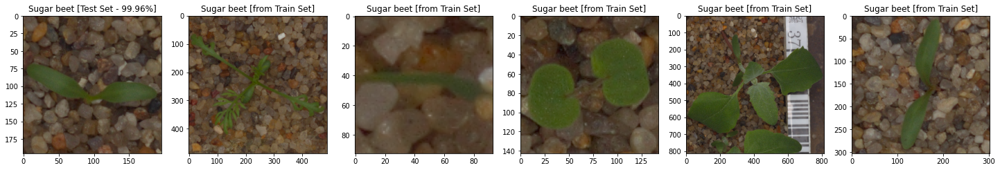

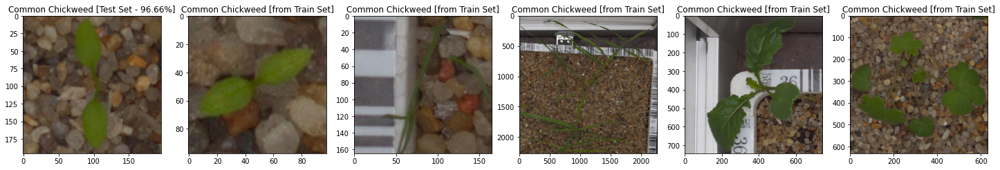

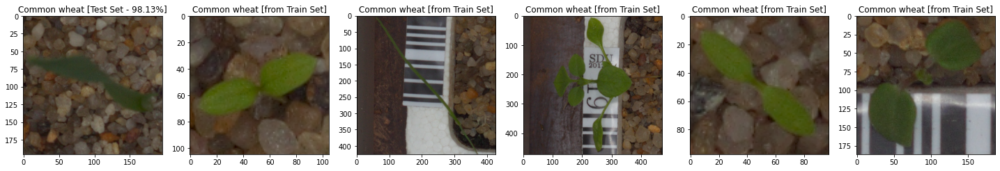

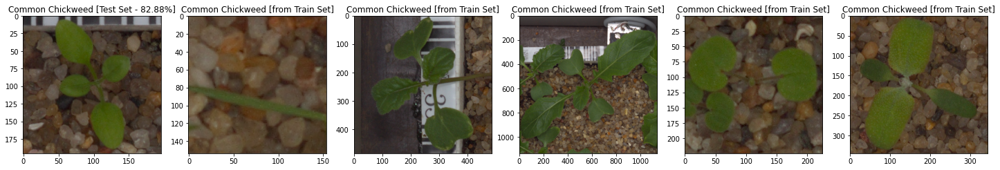

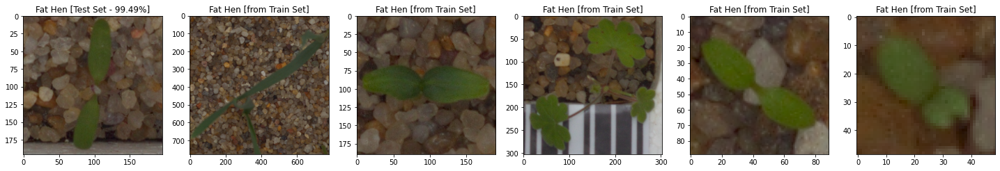

In [38]:
reference_sample_size = 5
for row, label in zip(range(len(sample_labels)), sample_labels):
  plt.figure(figsize=(25, 6 * (row + 1)))
  ax = plt.subplot(100*(row + 1) + 21)
  ax = plt.subplot(100*(row + 1) + 10*(reference_sample_size + 1) + 1)
  plt.title(species_submissions.iloc[label]['species'] + ' [Test Set - %0.2f%%]' % (y_pred[label].max() * 100))
  plt.imshow(img_to_array(tf.image.resize(X_test[label], [image_size[0], image_size[1]])))
  train_sample_ds = tf.data.Dataset.list_files(train_data_path + '/'+ species_submissions.iloc[label]['species'] + '/*.png')
  for i, file_tensor in zip(range(reference_sample_size), train_ds.take(reference_sample_size)):
    ax = plt.subplot(100*(row + 1) + 10*(reference_sample_size + 1) + (i+2))
    plt.title(species_submissions.iloc[label]['species'] + ' [from Train Set]')
    plt.imshow(mpimg.imread(tf.compat.as_str_any(file_tensor.numpy())))
plt.show()

In [37]:
classifier.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 196, 196, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 98, 98, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 98, 98, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 47, 47, 32)        9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 23, 23, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 16928)            